## This module is used to produce the traces after tracking and compare it with the ground truth or other tracking results

In [1]:
from docopt import docopt
from scipy.optimize import curve_fit
from scipy.signal import butter, filtfilt
from skimage.transform import resize
from sklearn.cluster import SpectralClustering
import sklearn.neighbors as sk

from zephir.__version__ import __version__
from zephir import *
from zephir.models.zephir import ZephIR
from zephir.utils.utils import *
from MatchPartial.traces import *

def get_slice_comb(dataset_path, t: int) -> np.ndarray:

    f = h5py.File(dataset_path / "data.h5", 'r')
    return f["data"][t]
    
def get_times_comb(dataset_path) -> np.ndarray:
    """These data have two separate timestamps for red and green channels. We
    will return the *later* of the two, for causality purposes. This way, the
    data from time T was acquired strictly before timestamp T."""
    f = h5py.File(dataset_path / "data.h5", 'r')
    t_max =  f["data"].shape[0]
    return np.arange(t_max)

In [2]:

dataset = Path('dataset/ZM9624_raw')
annotation_filename = 'coordinates.h5'
device = 'cuda'
trace_filename='traces.csv'
provenance = None
W_ids = None
t_iter =None
color = False
r=(1, 2, 2)
n_pixel=15
plot_name = trace_filename.replace('.csv', '.jpg')

In [41]:
df_final = extract_traces_df(dataset, 
                annotation_path=annotation_filename, 
                provenance=None,  
                r=(1, 2, 2) , 
                n_pixel=15, 
                trace_filename=trace_filename, 
                W_ids=None,
                color=False,
                high_res_color=False,
                t_iter=None)

Loading annotations ...


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)


Extracting traces ...


  0%|          | 0/1060 [00:00<?, ?it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)


worldline_id 105 not found


  0%|          | 1/1060 [00:00<03:57,  4.46it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  0%|          | 2/1060 [00:00<03:47,  4.65it/s]

worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  0%|          | 3/1060 [00:00<03:41,  4.76it/s]

worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  0%|          | 4/1060 [00:00<03:55,  4.48it/s]

worldline_id 105 not found
worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  0%|          | 5/1060 [00:01<03:45,  4.68it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|     

worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|          | 7/1060 [00:01<03:44,  4.69it/s]

worldline_id 105 not found
worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|          | 8/1060 [00:01<03:39,  4.80it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|     

worldline_id 105 not found
worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|          | 10/1060 [00:02<03:34,  4.88it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|    

worldline_id 105 not found
worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|          | 12/1060 [00:02<03:40,  4.75it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|    

worldline_id 105 not found


  1%|▏         | 14/1060 [00:02<03:40,  4.74it/s]

worldline_id 105 not found
worldline_id 105 not found


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  1%|▏         | 15/1060 [00:03<03:36,  4.84it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  2%|▏   

worldline_id 105 not found
worldline_id 105 not found


  2%|▏         | 17/1060 [00:03<03:29,  4.98it/s]/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/dataclass_helpers.py:58: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.df = pd.concat([self.df, data], ignore_index=True)
  2%|▏         | 17/1060 [00:03<03:44,  4.64it/s]

KeyboardInterrupt



Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_raw/traces/traces.csv


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/traces.py:482: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  flow_file = dataset/"flow_file.txt"
/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/traces.py:479: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  traces_file = dataset / "traces/traces.csv"


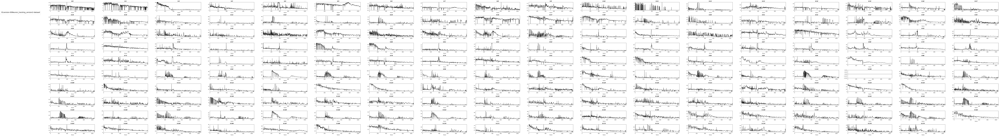

In [42]:
plot_from_df(dataset, 
    traces_file=None, 
    flow_file=None, 
    names=None, 
    update_names=False,
    moving_average=False, 
    colors_dict=None, 
    sorted_names=False,
    n_per_panel=10,
    plot_name=plot_name,
    plot_title=None,
    save_obj=None)


## Plot multiple traces overlapping with each other to compare

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

1. Plot multiple traces overlapping with each other

Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_orig.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_anchor.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_raw.csv


/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/traces.py:712: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize="xx-large", loc='upper right', bbox_to_anchor=(-.2, 0),
/work/venkatachalamlab/Hang/00Neuron_tracking_version2/01version/Matching_anchor/MatchPartial/traces.py:709: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim(ylim0, ylim1)


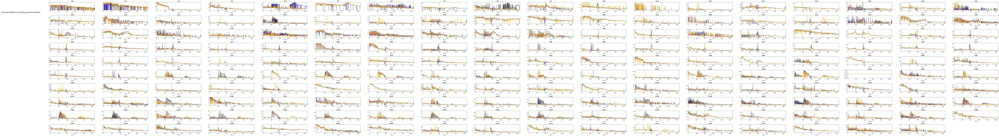

In [28]:
dataset_compare = Path('dataset/ZM9624_masked')
plot_from_multiple_dfs(
    dataset=dataset_compare,
    traces_files=[
        dataset/"traces/traces_orig.csv",
        dataset/"traces/traces_anchor.csv",
        dataset/"traces/traces_raw.csv"
    ],
    colors_list=["black", "blue", "orange"]
)

2. Plot the traces side by side

In [33]:
dataset= Path('dataset/ZM9624_masked')

plot_traces_stacked_by_name_multipage(
    dataset=dataset,
    traces_files=[
        dataset/"traces/traces_orig.csv",
        dataset/"traces/traces_anchor.csv",
        dataset/"traces/traces_raw.csv"
    ],
    colors_list=["black", "blue", "orange"],
    names_per_page=5  # adjust to control subplot size and layout
)

Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_orig.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_anchor.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_raw.csv


In [39]:
plot_traces_stacked_by_name_multipage(
    dataset=dataset,
    traces_files=[
        dataset/"traces/traces_orig.csv",
        dataset/"traces/traces_anchor.csv",
        dataset/"traces/traces_raw.csv"
    ],
    
    colors_list=["black", "blue", "orange"],
    names=["b'16'", "b'12'", "b'10'", "b'32'", "b'94'", "b'97'", "b'100'", "b'109'",  "b'105'", 
 "b'101'", "b'102'", "b'112'", "b'114'", "b'115'", "b'119'", "b'118'", "b'157'", "b'169'", 
 "b'172'", "b'174'"],
    plot_name='traces_thesis.pdf',
    names_per_page=5  # adjust to control subplot size and layout
)

Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_orig.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_anchor.csv
Loading traces from /home/hangdeng/work/00Neuron_tracking_version2/01version/dataset/ZM9624_masked/traces/traces_raw.csv
